# <p style="background-color:Green; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;"> Regression Problem ❓❓


**Regression** analysis is a set of statistical processes for estimating the relationships between a dependent outcomeand one or more independent features.

<center><img src ="https://www.nicolaromano.net/wp-content/uploads/2020/10/logolinreg.png">


## <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;"> Importing Libraries 📚</p>

In [1]:
# Import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;"> Loading Dataset 📅</p>


In [2]:
# Import the Dataset using pandas
Train = pd.read_csv(r'Train_data_regression.csv') # path
Test = pd.read_csv(r'Test_data_regression.csv') # path

In [3]:
Train.shape

(5880, 151)

In [4]:
# Display first 10 rows in Train dataset
Train.head(10)

,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,y
0,-0.746945,0.846646,-0.202470,0.028677,-0.229053,0.378089,-0.800458,0.414641,-1.504229,0.371135,...,-0.990873,0.864308,0.042010,-0.196266,-0.698771,-0.994566,-0.500914,0.003735,-0.353331,-456.665254
1,0.267893,0.686836,-2.099945,-0.356856,0.299254,0.098733,1.206721,-1.172500,-0.227677,2.061577,...,-0.540844,1.059226,-0.691391,0.029994,-0.566103,-0.885774,-1.312298,-0.938679,-1.134801,1058.205923
2,0.774361,0.812023,1.057683,-1.461385,-0.924284,0.323890,1.866386,0.326994,1.286274,-0.996723,...,0.247075,1.203377,0.765125,-0.427309,-0.563282,0.282035,0.126215,0.572231,-1.147129,-434.143673
3,-0.625636,-0.827090,0.602128,1.168934,0.814647,-0.800436,0.218008,0.355778,-0.448102,1.697075,...,0.717384,0.653825,1.290715,-0.439905,-0.202368,0.490357,-0.201219,-1.294190,-0.316879,977.514618
4,-0.976274,-0.673587,-0.103793,-0.076868,0.751871,0.097609,1.686413,-0.369834,1.308027,-0.979400,...,0.653964,0.200234,-0.079921,-1.305642,-0.837960,0.324081,1.216420,-0.520947,0.618585,-15.042199
5,-0.854954,-0.768267,1.171814,-0.695971,1.264707,1.295418,-0.984890,0.762152,-0.003448,1.356186,...,-0.461392,-0.190792,-1.210695,-2.210215,0.308951,-0.057145,1.859026,NaN,-0.269695,32.742834
6,0.784398,-0.382700,-0.635010,0.189111,-0.310170,0.240598,0.753878,0.216928,-0.108168,-0.586098,...,1.785643,0.804527,-0.026050,-1.364167,0.876982,-0.834078,1.624560,0.595359,1.356737,-813.606438
7,-1.919110,-0.502398,-0.443998,2.945112,-0.733891,-0.555276,0.257764,1.563856,-0.532898,-0.255989,...,0.181822,-0.728271,-1.682362,-0.332719,-0.137890,-0.114696,2.594162,NaN,-1.628567,362.979816
8,0.162938,2.051196,1.479045,-1.562278,1.799767,0.418559,0.606723,0.647076,-1.572640,-0.841949,...,0.422512,0.565458,-1.092555,-0.304089,-0.141261,-0.899892,1.313830,-0.399820,1.042088,-642.505580
9,0.651463,-0.735162,-1.560219,0.266378,-0.297301,0.346185,-0.932416,0.756884,0.751413,-1.060374,...,1.236996,-1.117987,1.069404,-0.050594,-0.061746,1.461063,0.854035,-0.660783,-1.164623,895.607057


In [5]:
Test.shape

(120, 151)

In [6]:
# Display first 10 rows in Test dataset
Test.head(10)

,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,y
0,1.081816,-1.131037,0.108628,1.077395,-0.750072,-0.564374,0.505181,1.628797,0.454544,-1.373511,...,-0.438376,0.206104,-1.408897,1.976744,-1.117125,-1.897746,-0.522654,2.638855,-1.503102,NaN
1,1.435743,0.773806,0.250435,-0.451541,0.441791,0.137116,0.349729,0.095813,0.137996,0.468987,...,-0.581815,1.340089,1.217877,0.691981,0.115697,0.184174,-0.921121,0.221608,1.592319,NaN
2,0.415317,-0.581344,-0.245195,-0.315032,0.363002,-1.554639,-0.559687,-1.162702,2.325160,0.381909,...,-1.162827,0.763204,2.857790,0.142008,0.015687,-1.858612,0.447087,0.945012,-0.131331,NaN
3,0.178376,-0.329287,-0.924843,2.514518,-0.008991,0.678703,0.040802,0.286314,-2.073584,-0.748560,...,2.576744,0.432035,0.717691,2.406410,-0.483214,-0.638041,0.323221,-0.973862,-0.353541,NaN
4,1.217485,0.675895,2.390781,0.326706,0.342779,-1.964247,0.524710,-1.985868,0.423961,-0.660297,...,0.425173,-0.038636,0.537029,0.547327,0.503873,0.561255,1.404780,-0.104122,-0.924451,NaN
5,0.140106,0.382456,-0.127122,-1.119771,0.458747,-3.436277,-0.228845,-0.410870,0.025192,1.921239,...,0.060271,-0.683783,0.936039,-0.640786,1.178966,-0.626844,-1.016316,-1.108966,1.297157,NaN
6,0.149338,-1.929914,-1.120863,-0.043642,0.969424,-2.431424,-0.089162,0.652455,-0.211406,0.229038,...,0.032995,-0.552484,-0.604541,-0.436469,-1.328633,0.050813,1.440549,-0.178086,1.272635,NaN
7,0.728542,2.128252,-0.849019,-2.316782,-1.666356,1.194550,-0.315684,0.126875,-3.254223,1.058784,...,-0.583942,2.063978,-0.052602,0.186529,-1.357131,-0.604892,-0.550177,-1.208768,-0.558357,NaN
8,-1.931525,-0.001033,1.840331,-0.899644,0.195682,-0.991674,0.308840,-0.412611,0.716138,-0.578879,...,-0.394475,0.272912,-1.554583,-0.507571,1.295641,0.856341,-0.253962,0.647889,2.577960,NaN
9,-2.191199,-1.203643,-0.671067,-0.265129,-1.226484,-0.032887,0.012910,0.008804,0.466815,2.284283,...,0.478377,0.279806,0.890621,-0.466338,-0.907915,-1.111666,0.543902,0.018085,-0.668522,NaN


In [7]:
# Display the General information of the Train dataset 
Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5880 entries, 0 to 5879
Columns: 151 entries, 0 to y
dtypes: float64(151)
memory usage: 6.8 MB


In [8]:
# Display the Descriptive statistics of the Train dataset
Train.describe()

,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,y
count,5880.000000,5880.000000,5880.000000,5880.000000,5880.000000,5880.000000,5880.000000,5880.000000,5880.000000,5880.000000,...,5880.000000,5880.000000,5880.000000,5880.000000,5646.000000,5880.000000,5880.000000,5648.000000,5880.000000,5880.000000
mean,-0.007394,0.000425,-0.002601,0.004579,0.007436,-0.026552,-0.006641,0.004184,0.003450,-0.023908,...,0.006088,0.028312,0.006323,0.000642,-0.007483,-0.009468,0.004947,-0.007239,-0.023888,16.448264
std,1.005750,0.990548,0.993055,0.993757,1.014672,1.003707,1.004082,1.002064,0.993768,0.998482,...,1.003757,0.995408,1.002777,0.992913,0.987847,0.996086,1.000050,1.010005,0.998827,546.081390
min,-3.817828,-3.427435,-3.305457,-3.835789,-3.834551,-3.714264,-3.522312,-3.643394,-3.371236,-3.442391,...,-3.637346,-3.371187,-4.528516,-3.636564,-3.917905,-3.884700,-3.971690,-3.389562,-3.097664,-1923.316215
25%,-0.703793,-0.666062,-0.682795,-0.665792,-0.681277,-0.715220,-0.677959,-0.674220,-0.652994,-0.695976,...,-0.672669,-0.642618,-0.654398,-0.681068,-0.668065,-0.668530,-0.672936,-0.678585,-0.683766,-349.282875
50%,-0.010246,-0.011336,-0.001572,0.004499,0.005538,-0.017905,-0.004032,-0.008591,0.004352,-0.011690,...,0.008889,0.031378,0.004182,0.005697,-0.023565,-0.006680,0.001592,-0.021068,-0.028721,8.312237
75%,0.675946,0.681987,0.674457,0.683197,0.686132,0.633499,0.670655,0.677254,0.665483,0.636441,...,0.675561,0.686282,0.681578,0.674187,0.667559,0.678897,0.657775,0.666927,0.660288,382.141928
max,3.498253,3.387892,3.497347,3.992916,3.480771,3.502251,3.446747,4.054844,3.909476,4.119165,...,3.728796,3.801476,3.389847,3.570224,3.625750,3.494394,3.744421,3.717123,3.724939,2122.244531


In [9]:
# Display the Descriptive statistics of the Test dataset
Test.describe()

,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,y
count,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,...,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,0.0
mean,-0.046425,0.057732,-0.019362,-0.061664,0.106093,-0.042591,-0.041891,-0.006998,-0.001572,0.107359,...,0.089425,-0.124518,-0.087624,0.043308,-0.047325,-0.180237,0.090425,0.052852,0.046364,NaN
std,1.058785,0.969802,0.964586,1.091932,0.953963,1.181653,0.934968,0.945804,1.181324,1.006313,...,0.998218,0.986048,0.995164,0.959366,1.132035,1.035208,0.908965,0.983317,0.957506,NaN
min,-3.042143,-2.501745,-2.427394,-2.742618,-2.611975,-3.657945,-2.725787,-1.985868,-3.254223,-2.348718,...,-3.108912,-3.207172,-2.464228,-2.580909,-3.013721,-2.658908,-2.639924,-2.595515,-2.057615,NaN
25%,-0.600205,-0.581762,-0.661111,-0.821632,-0.642823,-0.796136,-0.574749,-0.555531,-0.812652,-0.572789,...,-0.527549,-0.703970,-0.717785,-0.496018,-0.801831,-0.896127,-0.523748,-0.601272,-0.522901,NaN
50%,0.044625,0.069334,-0.055486,-0.166816,0.054575,-0.021812,0.041055,0.004611,0.029891,0.117278,...,0.055042,-0.109543,-0.107518,0.003852,0.051295,-0.190129,0.054699,-0.019335,-0.027657,NaN
75%,0.614523,0.681857,0.620533,0.566279,0.739694,0.760565,0.430650,0.569923,0.839145,0.832635,...,0.662505,0.497467,0.640414,0.565020,0.637485,0.474187,0.693731,0.733806,0.661566,NaN
max,2.639922,2.149759,2.393066,3.381065,2.295842,2.826832,3.082713,2.459431,2.566033,2.284283,...,3.944956,2.297813,2.857790,3.425613,2.718624,2.352282,2.397155,2.638855,2.577960,NaN


## <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;"> Understanding the Dataset 🤔</p>


In [10]:
# Let's see how many Null values are present in the database
Train.isna().sum()

0        0
1        0
2        0
3        0
4        0
      ... 
146      0
147      0
148    232
149      0
y        0
Length: 151, dtype: int64

<AxesSubplot:>

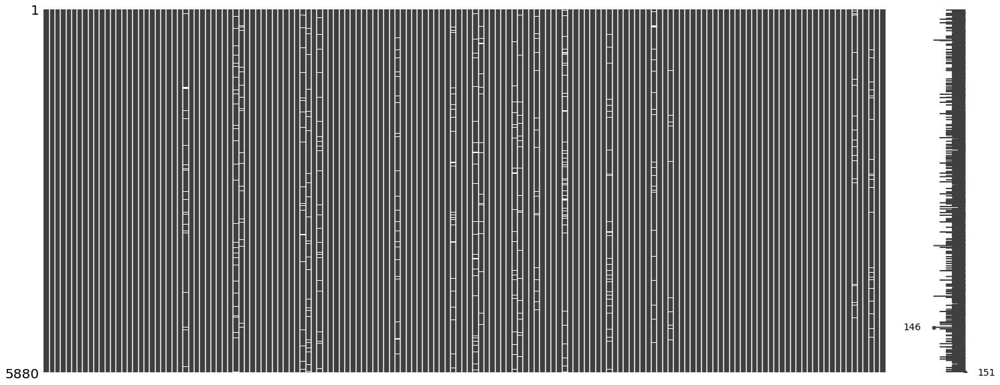

In [11]:
# Visualize missing values in the Train dataset
import missingno as msno
msno.matrix(Train)

We have some missing values in the dataset.

In [12]:
# Now, we will drop all those rows which have + or - inf. values
Train = Train.replace([np.inf, -np.inf], np.nan).dropna(axis=0)

In [13]:
# Now let's check if there is any null value left
Train.isna().sum()

0      0
1      0
2      0
3      0
4      0
      ..
146    0
147    0
148    0
149    0
y      0
Length: 151, dtype: int64

<AxesSubplot:>

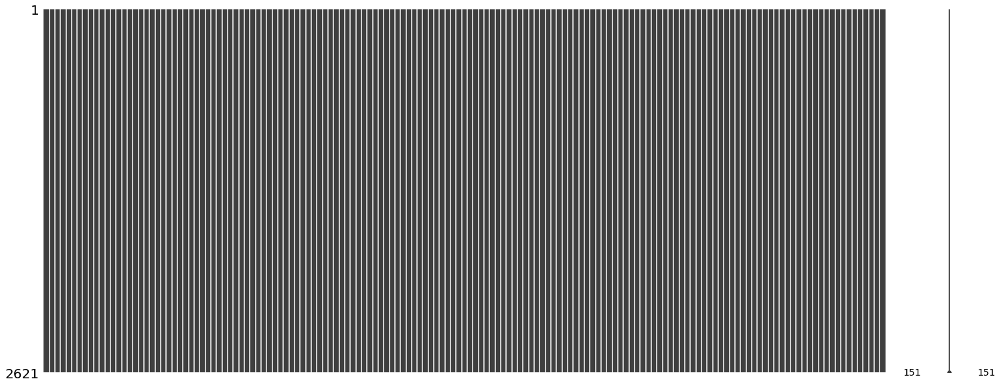

In [14]:
# Removed all the rows with null values
msno.matrix(Train)

Removed all the missing values from the dataset.

In [15]:
# Display first 8 rows in Test dataset
Train.head(8)

,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,y
0,-0.746945,0.846646,-0.202470,0.028677,-0.229053,0.378089,-0.800458,0.414641,-1.504229,0.371135,...,-0.990873,0.864308,0.042010,-0.196266,-0.698771,-0.994566,-0.500914,0.003735,-0.353331,-456.665254
1,0.267893,0.686836,-2.099945,-0.356856,0.299254,0.098733,1.206721,-1.172500,-0.227677,2.061577,...,-0.540844,1.059226,-0.691391,0.029994,-0.566103,-0.885774,-1.312298,-0.938679,-1.134801,1058.205923
2,0.774361,0.812023,1.057683,-1.461385,-0.924284,0.323890,1.866386,0.326994,1.286274,-0.996723,...,0.247075,1.203377,0.765125,-0.427309,-0.563282,0.282035,0.126215,0.572231,-1.147129,-434.143673
3,-0.625636,-0.827090,0.602128,1.168934,0.814647,-0.800436,0.218008,0.355778,-0.448102,1.697075,...,0.717384,0.653825,1.290715,-0.439905,-0.202368,0.490357,-0.201219,-1.294190,-0.316879,977.514618
6,0.784398,-0.382700,-0.635010,0.189111,-0.310170,0.240598,0.753878,0.216928,-0.108168,-0.586098,...,1.785643,0.804527,-0.026050,-1.364167,0.876982,-0.834078,1.624560,0.595359,1.356737,-813.606438
8,0.162938,2.051196,1.479045,-1.562278,1.799767,0.418559,0.606723,0.647076,-1.572640,-0.841949,...,0.422512,0.565458,-1.092555,-0.304089,-0.141261,-0.899892,1.313830,-0.399820,1.042088,-642.505580
9,0.651463,-0.735162,-1.560219,0.266378,-0.297301,0.346185,-0.932416,0.756884,0.751413,-1.060374,...,1.236996,-1.117987,1.069404,-0.050594,-0.061746,1.461063,0.854035,-0.660783,-1.164623,895.607057
13,-1.046453,0.676589,-0.976662,0.915287,0.072303,0.029022,-0.060874,0.023030,-0.090538,0.523125,...,0.637846,0.144614,0.107622,-0.892374,-0.145821,0.907577,0.012186,-0.363756,0.846091,-97.776198


In [16]:
# display the General information of the Test dataset 
Test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Columns: 151 entries, 0 to y
dtypes: float64(151)
memory usage: 141.7 KB


In [17]:
# Let's check if there is any null value in the Test Dataset
Test.isna().sum()

0        0
1        0
2        0
3        0
4        0
      ... 
146      0
147      0
148      0
149      0
y      120
Length: 151, dtype: int64

# <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;"> Exploratory data analysis 📉</p>


In [18]:
# Pandas profiling to get automatic analysis of the data

from pandas_profiling import ProfileReport
ProfileReport(Train, title='Pandas Profiling Report',explorative=True,minimal=True)

Render HTML: 100%|██████████| 1/1 [00:02<00:00,  2.99s/it]


In [19]:
# Output to HTML file pandas_profiling_report.html
ProfileReport(Train, title='Pandas Profiling Report',explorative=True,minimal=True).to_file(output_file="index.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 66.89it/s]


    max_rows_analyzed is smaller than dataset shape 5880...
        randomly sampled 1000 rows from read CSV file
Shape of your Data Set loaded: (1000, 151)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    151 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 1000 exceeds maximum, randomly sampling 1000 rows for EDA...
5 numeric variables in data exceeds limit, taking top 5 variables
Number of All Scatter Plots = 15


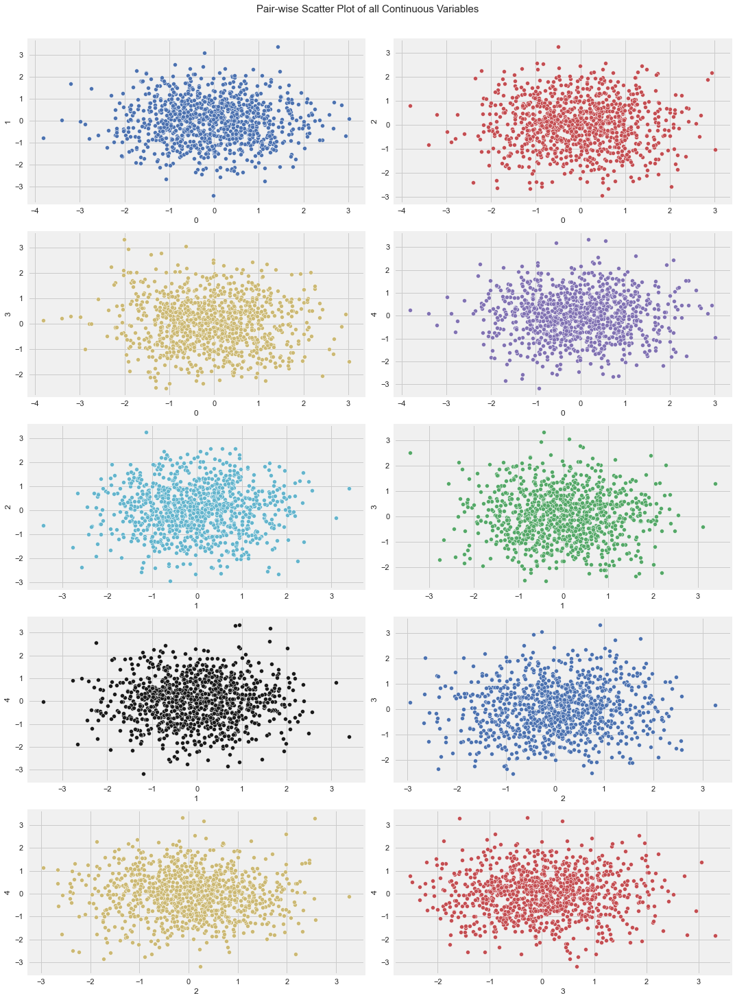

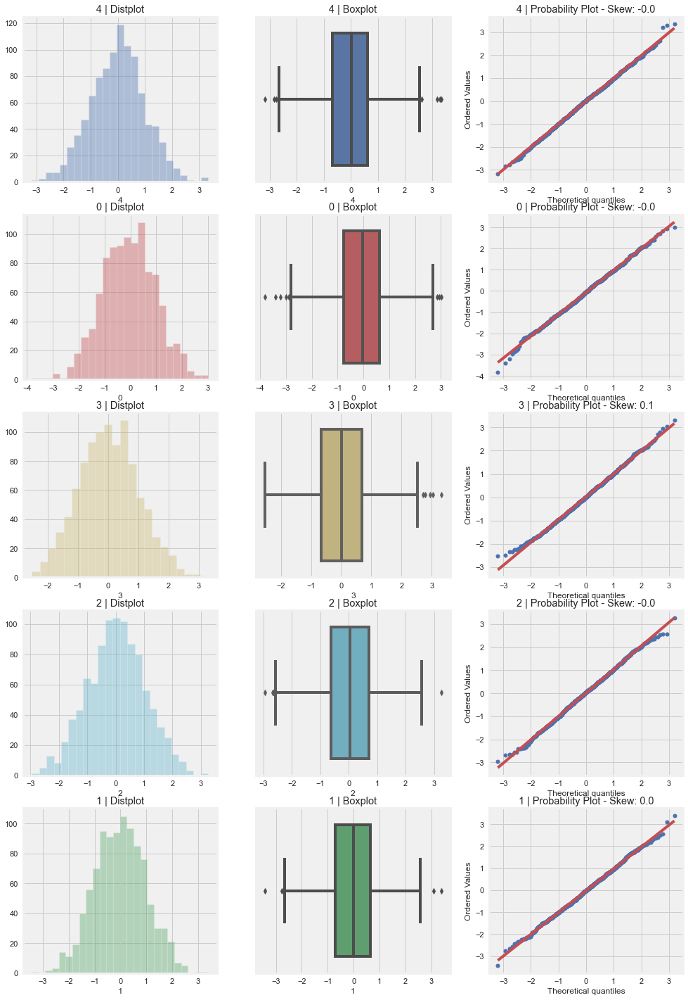

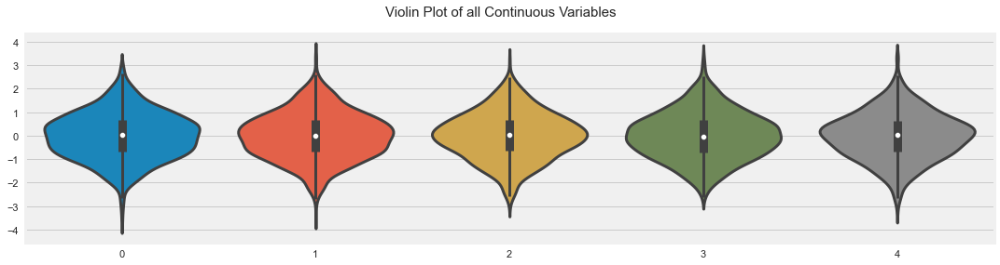

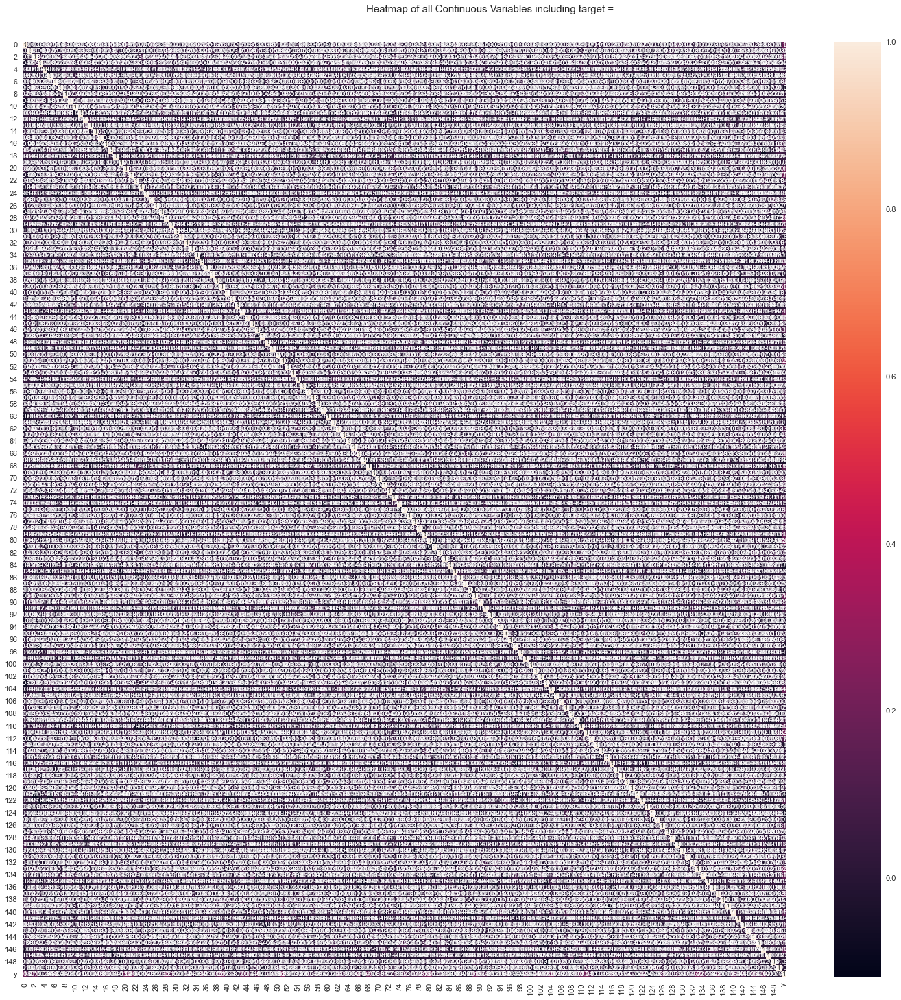

No categorical or numeric vars in data set. Hence no bar charts.
Time to run AutoViz = 59 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [31]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()

filename = "./Train_data_regression.csv"
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=None,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=1000,
    max_cols_analyzed=5,
)

## <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;">  Split into Training and Testing Data 📉</p>


In [21]:
# import the train_test_split function from the sklearn library
from sklearn.model_selection import train_test_split

In [22]:
# Apply the function and split the data 
x_train,x_test,y_train,y_test = train_test_split(Train.iloc[:,:150],
                                                 Train['y'],test_size = 0.25)

In [23]:
# Display first 6 rows in x_train dataset
x_train.head(6)

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
1324,-0.012681,-0.814709,-0.994535,0.618086,1.287214,2.068432,0.257670,-0.835794,-0.419581,-0.235359,...,-0.813977,0.996660,0.260440,-0.344085,0.977940,1.049654,-1.437521,0.674421,0.810012,0.612743
2441,-1.165060,1.416651,-0.207338,2.661792,-0.957353,2.211040,-0.025061,-0.920630,-1.071083,-0.184848,...,-0.083480,-0.078036,0.227427,1.303315,-0.271518,0.265028,0.009759,-1.902778,0.796313,0.213081
1339,1.306103,0.473538,1.421672,-1.456668,0.510569,1.329384,-0.672259,-2.074724,-0.405062,1.604722,...,0.148304,1.058821,-0.559823,-0.488321,-0.397881,0.389297,-0.726134,0.539023,-0.044426,1.028131
4203,-0.998332,1.196624,0.139710,-1.086055,-0.131482,-1.294064,1.670833,0.054057,-0.381025,-0.886112,...,0.340967,0.789799,-1.330808,0.062071,1.048154,0.642306,0.128803,-0.712306,-0.446225,0.995128
4477,1.429863,-0.090436,0.263328,0.008988,-0.587870,0.576746,0.134317,0.157387,-0.553574,1.267989,...,1.743696,-0.980896,0.656741,-0.737721,0.122473,0.620458,0.073923,0.474938,0.796241,-1.208583
1478,-1.135788,1.574911,-0.110815,-0.536503,0.137715,0.527274,0.769588,-0.817146,-1.138739,-0.723526,...,-0.934019,0.723105,1.150251,-1.408980,0.201414,0.662294,-0.906102,-0.345209,-1.103643,-0.491794


In [24]:
# Display first 6 rows in x_train dataset
x_test.head(6)

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
2124,-0.139128,1.208393,-1.085207,0.995726,0.564010,0.230919,0.673127,0.322123,-0.101870,-0.289980,...,-0.438012,0.746018,-0.180026,0.072466,-1.045304,-0.347794,1.721363,-0.879297,-0.280818,-1.442654
5394,-0.932780,-0.176138,-0.351689,-0.801997,0.483302,0.063522,0.672462,0.019334,0.437272,0.690944,...,-0.718917,0.188699,0.357581,0.447899,-0.769556,-0.509801,0.196354,0.363063,-1.040048,-0.819014
4907,0.683041,0.624289,-2.197180,2.432297,-0.599594,-0.359735,-0.116207,0.277202,-1.558437,-0.076864,...,0.721143,1.028762,-1.279320,-1.394556,0.190502,0.115169,0.699510,0.248969,0.409697,-0.107529
1357,0.212206,1.165165,-0.301485,-0.096455,0.632757,0.505446,1.262932,1.262305,-0.134009,0.291549,...,-0.116146,-0.535997,-1.128676,0.188604,1.728367,-0.674871,-0.775624,0.195444,1.338179,0.699456
3037,-1.151516,1.172539,-1.557235,-0.830848,-0.559148,1.707355,0.343780,-0.915067,0.317272,-0.946464,...,-0.043034,1.529850,0.383968,-0.315387,-0.139714,1.174136,-1.674995,-1.425429,-0.271667,0.512506
3819,1.635533,-0.841046,1.260129,-0.421125,1.042960,-0.513254,1.029350,1.233776,-0.237298,0.262667,...,-0.819483,0.407019,1.538300,1.410195,-0.567862,1.747659,0.407825,-0.911580,2.265213,-1.214009


In [25]:
# Display first 6 rows in x_train dataset
y_train.head(6)

1324   -796.163839
2441      1.406264
1339   -259.092973
4203    106.271414
4477    290.304025
1478    -71.919224
Name: y, dtype: float64

## <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;">  Model Creation and Fitting 🕹️</p>


In [26]:
# import the BayesianRidge Model from sklearn 
from sklearn.linear_model import BayesianRidge

# Define the Model
model = BayesianRidge()

# Fit The Model on the x_train, y_train Dataset 
model.fit(x_train,y_train);

## <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;">  Model Accuracy ✅</p>


In [27]:
# Get The Accuracy of The Model
model.score(x_test,y_test)

0.9700373599286978

## <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;">  Predict The Class - Test DataSet 🔮</p>


In [28]:
# Predict on Test DataSet 
final_result = model.predict(Test.iloc[:,:150])

In [29]:
# Save the prediction as result.csv file in the local directory
final_result = pd.DataFrame(final_result)
final_result.to_csv('result_regression.csv')

## <p style="background-color:purple; font-family:newtimeroman; font-size:180%; text-align:center; border-radius: 15px 50px;">  Thank you for reading! 😀</p>
